# Долгосрочная оценка моделей

Этот ноутбук считает метрики **долгосрочного** автоиндуктивного прогноза
($L > 150$ шагов) для всех систем (Рёсслер, Хиндмарш–Розе, квазипериодический генератор)
и всех выбранных моделей.  
Заполняет таблицу `tab:long_all` и строит набор сравнительных графиков:
временные ряды, 3D-фазовые портреты, накопление ошибки во времени,
маргинальные распределения и спектры мощности на val-области.

## Как пользоваться
1. В ячейке **CONFIG** ниже задайте для каждой системы список чекпоинтов,
   которые надо оценить.  Каждый элемент — это словарь
   `{"name": "<отображаемое имя>", "ckpt": "<путь>"}`.
   `name` будет использоваться в подписях графиков и в таблице.
2. По желанию подкрутите общие параметры (`T_MAX`, `SPLIT`, `THRESHOLD`).
3. `Run All`.  В конце получите DataFrame `df_long` и его LaTeX-версию.

In [10]:
# === setup ==================================================================
import os, sys
if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")
sys.path.insert(0, "notebooks")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

import eval_utils as eu
from importlib import reload
reload(eu)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)
print("workdir:", os.getcwd())

device: cuda
workdir: /home/timmiakov/internal_exps/dynsys-hub


## CONFIG: какие чекпоинты валидировать

Здесь же задаются и **отображаемые имена** моделей в таблице/легендах.
Если в каком-то столбце нужно оставить прочерк — закомментируйте/удалите строку.

In [ ]:
CHECKPOINTS = {
    "quasi_periodic": [
        {"name": "RNN",   "ckpt": "checkpoints/paper_ckpts/qp_mlp/quasi_periodic_rnn.pt"},
        {"name": "NODE",  "ckpt": "checkpoints/paper_ckpts/qp_node/quasi_periodic_node.pt"},
        {"name": "ANODE", "ckpt": "checkpoints/paper_ckpts/qp_anode/quasi_periodic_anode.pt"},
        {"name": "CSODE", "ckpt": "checkpoints/paper_ckpts/qp_csode/quasi_periodic_csode.pt"},
        {"name": "FNODE", "ckpt": "checkpoints/qp_csode_P1D_full/quasi_periodic_csode.pt"},
    ],
    "rossler": [
        {"name": "MLP", "ckpt": "checkpoints/paper_ckpts/rsl_mlp/rossler_mlp.pt"},
        {"name": "RNN",   "ckpt": "checkpoints/paper_ckpts/rsl_node/rossler_node.pt"},
        {"name": "NODE",  "ckpt": "checkpoints/paper_ckpts/rossler_node/rossler_node.pt"},
        {"name": "ANODE", "ckpt": "checkpoints/paper_ckpts/rossler_anode/rossler_anode.pt"},
        {"name": "CSODE", "ckpt": "checkpoints/paper_ckpts/rossler_csode/rossler_csode.pt"},
        {"name": "FNODE", "ckpt": "checkpoints/rossler_fsode_P1D_full/rossler_fsode.pt"},
    ],
    "hindmarsh_rose": [
        {"name": "RNN",   "ckpt": "checkpoints/paper_ckpts/hr_fnodev2_v6_tf10/hindmarsh_rose_fnode_v2.pt"},
        {"name": "NODE",  "ckpt": "checkpoints/paper_ckpts/hr_node/hindmarsh_rose_node.pt"},
        {"name": "ANODE", "ckpt": "checkpoints/paper_ckpts/hr_anode/hindmarsh_rose_anode.pt"},
        {"name": "CSODE", "ckpt": "checkpoints/paper_ckpts/hr_csode/hindmarsh_rose_csode.pt"},
        {"name": "FNODE", "ckpt": "checkpoints/hr_fsode_P1D_full/hindmarsh_rose_fsode.pt"},
    ],
}


# Глобальные настройки оценки
T_MAX     = None    # None => полная траектория; иначе физическое время в секундах
SPLIT     = 0.8     # train/val граница, как при обучении
THRESHOLD = 1.0     # T_valid: порог нормированной RMSE
KL_BINS   = 50      # bins для гистограммного KL
KDE_BW_SCALE = 0.2  # ширина окна KDE-кривых на marginal-плотах:
                    # < 1 — меньше сглаживания, кривые точнее повторяют бины истины.
MODEL_ORDER = ["MLP", "RNN", "NODE", "ANODE", "CSODE", "FNODE"]

# Куда сохранять артефакты (графики и LaTeX-таблицы)
OUT_DIR = "notebooks/out_long"
os.makedirs(OUT_DIR, exist_ok=True)

## Загрузка чекпоинтов и оценка

In [12]:
results = {}   # {system: [evaluate_long(...), ...]}
loaded  = {}   # {system: [LoadedModel, ...]}

for sys_name, ck_list in CHECKPOINTS.items():
    results[sys_name] = []
    loaded[sys_name]  = []
    print(f"\n=== {eu.SYSTEM_LABELS[sys_name]} ===")
    for entry in ck_list:
        if not os.path.isfile(entry["ckpt"]):
            print(f"  [skip] {entry['name']}: file not found ({entry['ckpt']})")
            continue
        try:
            lm = eu.load_checkpoint(entry["name"], entry["ckpt"], device=device)
        except Exception as e:
            print(f"  [skip] {entry['name']}: load error: {e}")
            continue
        if lm.system != sys_name:
            print(f"  [skip] {entry['name']}: ckpt system={lm.system} ≠ {sys_name}")
            continue
        res = eu.evaluate_long(lm, t_max=T_MAX, split=SPLIT,
                                threshold=THRESHOLD, bins=KL_BINS)
        results[sys_name].append(res)
        loaded[sys_name].append(lm)
        print(
            f"  {entry['name']:>6s} [{lm.model_type:>8s}]  "
            f"RMSE_val={res['rmse_val']['rmse']:.4f}  "
            f"MAE_val={res['rmse_val']['mae']:.4f}  "
            f"T_valid={res['t_valid']:.2f}  "
            f"D_KL={res['sym_kl']:.4f}  "
            + (f"T_burst_pred={res['burst_pred'][0]:.2f}" if sys_name == "hindmarsh_rose" else "")
        )


=== Квазипериодический генератор ===
     RNN [fnode_v2]  RMSE_val=2.6954  MAE_val=1.7396  T_valid=149.08  D_KL=0.0254  
    NODE [    node]  RMSE_val=0.2354  MAE_val=0.1510  T_valid=160.00  D_KL=0.0303  
   ANODE [   csode]  RMSE_val=0.5023  MAE_val=0.3042  T_valid=160.00  D_KL=0.0226  
   CSODE [   csode]  RMSE_val=0.5023  MAE_val=0.3042  T_valid=160.00  D_KL=0.0226  
   FNODE [   csode]  RMSE_val=0.1476  MAE_val=0.0898  T_valid=160.00  D_KL=0.0080  

=== Система Рёсслера ===
     RNN [   fnode]  RMSE_val=6.6064  MAE_val=4.9038  T_valid=100.10  D_KL=0.7809  
    NODE [    node]  RMSE_val=3.2327  MAE_val=2.1883  T_valid=153.60  D_KL=0.5913  
   ANODE [   csode]  RMSE_val=3.3355  MAE_val=2.1285  T_valid=149.05  D_KL=0.4696  
   CSODE [   csode]  RMSE_val=3.3355  MAE_val=2.1285  T_valid=149.05  D_KL=0.4696  
   FNODE [   csode]  RMSE_val=2.1067  MAE_val=1.2450  T_valid=153.45  D_KL=0.1128  

=== Система Хиндмарша–Розе ===
     RNN [fnode_v2]  RMSE_val=1.5063  MAE_val=0.8680  T_valid=82

## Сводная таблица  (tab:long_all)
Колонки RMSE/MAE считаются на val-области в исходных единицах; $T_{\text{valid}}$ — **суммарное**
время по всей траектории, в течение которого нормированная RMSE $\le \sigma = 1$
(не подряд, а кумулятивно по всем шагам);  $D_{\mathrm{KL}}$ — гистограммный симметричный KL на val-области
(в нормированных координатах);  для Хиндмарша–Розе вместо $D_{\mathrm{KL}}$ выводится средняя
длительность burst-а $\overline{T}_{\text{burst}}$.

In [13]:
df_long = eu.build_long_table(results, model_order=MODEL_ORDER)
df_long

Система Рёсслера                             Система Хиндмарша–Розе  \
                   RMSE       MAE T_valid      D_KL                   RMSE   
Модель                                                                       
RNN            6.606378  4.903791  100.10  0.780907               1.506347   
NODE           3.232653  2.188346  153.60  0.591282               1.278662   
ANODE          3.335486  2.128459  149.05  0.469645               1.613770   
CSODE          3.335486  2.128459  149.05  0.469645               1.559293   
FNODE          2.106712  1.245009  153.45  0.112768               1.370007   

                                   Квазипериодический генератор            \
             MAE T_valid   T_burst                         RMSE       MAE   
Модель                                                                      
RNN     0.868027   829.5  2.100000                     2.695393  1.739629   
NODE    0.717374  1059.9  2.111111                     0.235365  0.151023   
ANODE   0.957564   908.9  2.020000                     0.502276  0.304232   
CSODE   0.907197   683.4  2.144444                     0.502276  0.304232   
FNODE   0.758143  1107.8  2.055556                     0.147562  0.089828   

                          
       T_valid      D_KL  
Модель                    
RNN     149.08  0.025393  
NODE    160.00  0.030307  
ANODE   160.00  0.022595  
CSODE   160.00  0.022595  
FNODE   160.00  0.008012

In [14]:
# Сохраняем CSV + LaTeX
csv_path  = os.path.join(OUT_DIR, "long_table.csv")
tex_path  = os.path.join(OUT_DIR, "long_table.tex")
df_long.to_csv(csv_path)

gt_row = eu.gt_row_long(results)
hr_key = (eu.SYSTEM_LABELS['hindmarsh_rose'], 'T_burst')
if hr_key in gt_row:
    caption = (
        f"Долгосрочные предсказания на трёх динамических системах. "
        f"Для Хиндмарша–Розе истинное значение "
        f"$\\overline{{T}}_{{\\text{{burst}}}} \\approx {gt_row[hr_key]:.2f}$ с "
        f"(показано в строке 'GT (истина)')."
    )
else:
    caption = "Долгосрочные предсказания на трёх динамических системах"

latex_str = eu.df_to_latex(
    df_long,
    float_format="{:.3f}",
    caption=caption,
    label="tab:long_all",
    gt_row=gt_row,
    gt_label="GT (истина)",
)
with open(tex_path, "w") as f:
    f.write(latex_str)
print(f"-> wrote {csv_path}")
print(f"-> wrote {tex_path}\n")
print(latex_str)

-> wrote notebooks/out_long/long_table.csv
-> wrote notebooks/out_long/long_table.tex

\begin{table}[h!]
\centering
\label{tab:long_all}
\resizebox{\textwidth}{!}{
\begin{tabular}{|l|cccc|cccc|cccc|}
\hline
\multirow{2}{*}{Модель} & \multicolumn{4}{c|}{Система Рёсслера} & \multicolumn{4}{c|}{Система Хиндмарша–Розе} & \multicolumn{4}{c|}{Квазипериодический генератор} \\
\cline{2-13}
 & RMSE & MAE & $T_{\text{valid}}$ & $D_{\mathrm{KL}}$ & RMSE & MAE & $T_{\text{valid}}$ & $\overline{T}_{\text{burst}}$ & RMSE & MAE & $T_{\text{valid}}$ & $D_{\mathrm{KL}}$ \\
\hline
GT (истина) & --- & --- & --- & --- & --- & --- & --- & 2.040 & --- & --- & --- & --- \\
\hline
RNN & 6.606 & 4.904 & 100.100 & 0.781 & 1.506 & 0.868 & 829.500 & 2.100 & 2.695 & 1.740 & 149.080 & 0.025 \\
NODE & 3.233 & 2.188 & 153.600 & 0.591 & 1.279 & 0.717 & 1059.900 & 2.111 & 0.235 & 0.151 & 160.000 & 0.030 \\
ANODE & 3.335 & 2.128 & 149.050 & 0.470 & 1.614 & 0.958 & 908.900 & 2.020 & 0.502 & 0.304 & 160.000 & 0.023 \\
CSO

## Графики

Для каждой системы — четыре типа визуализации:
1. **Временные ряды** на полной длине траектории; вертикальная линия — train/val граница.
2. **Накопление ошибки** во времени (нормированная RMSE) — log-scale.
3. **Маргинальные распределения** на val-области для компоненты `x`.
4. **PSD** (спектр мощности) на val-области для компоненты `x`.
5. **3D-фазовые портреты** для истинной траектории и каждой модели (на val-области).

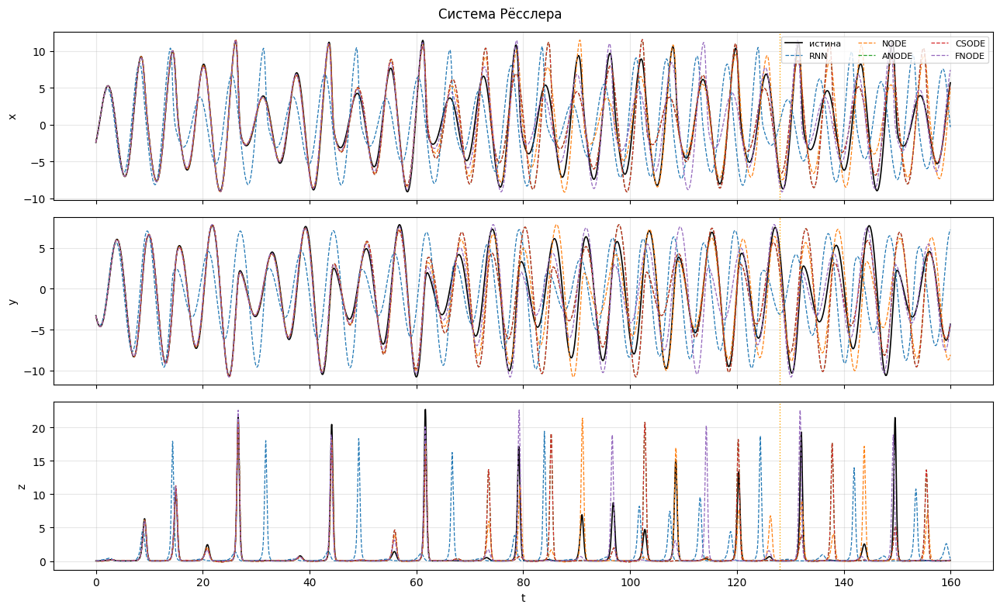

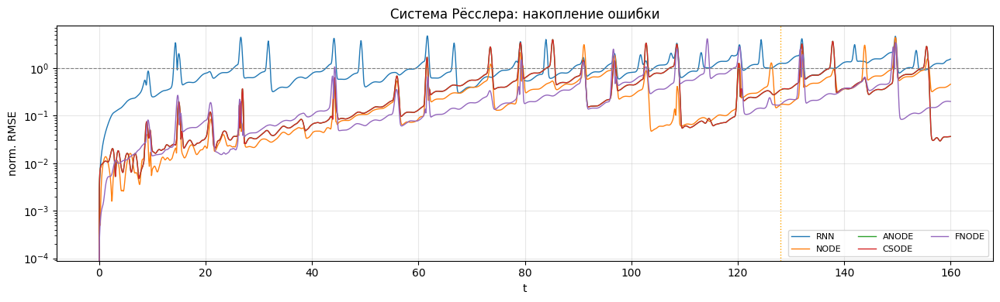

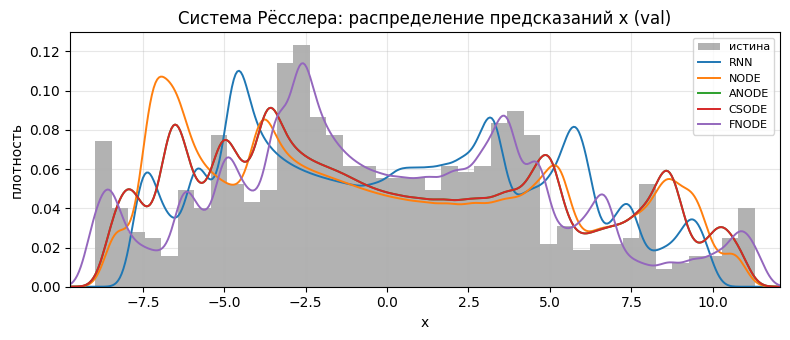

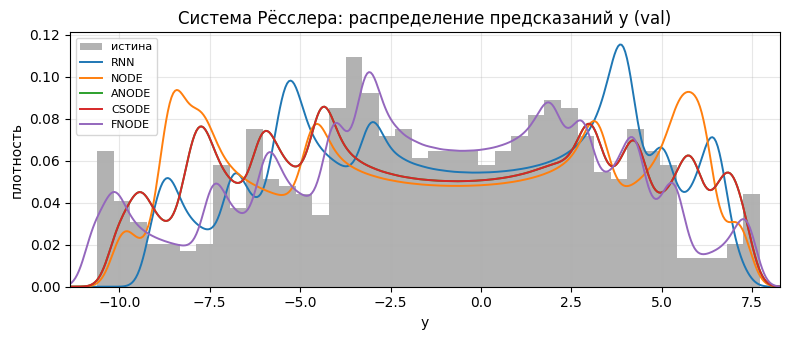

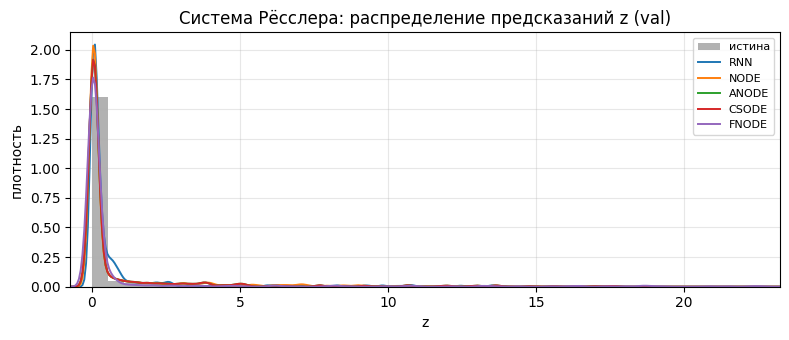

...

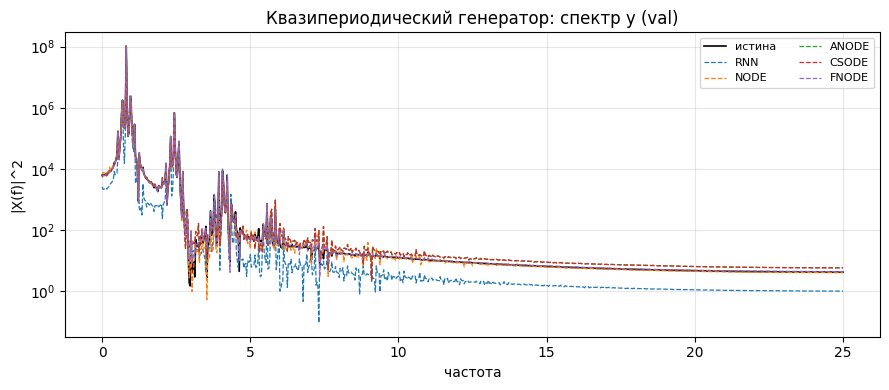

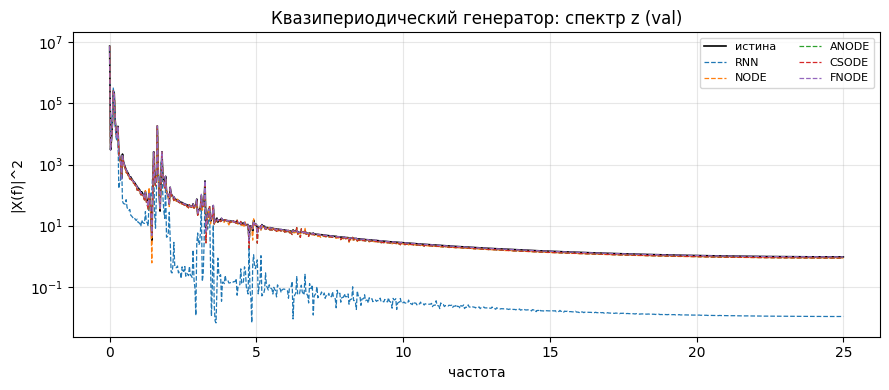

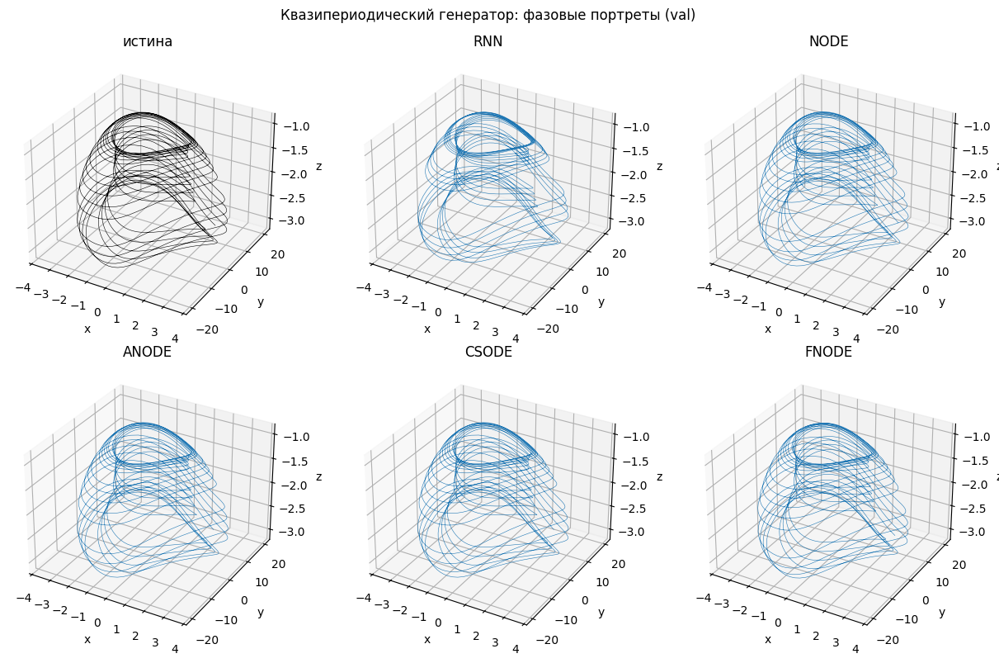

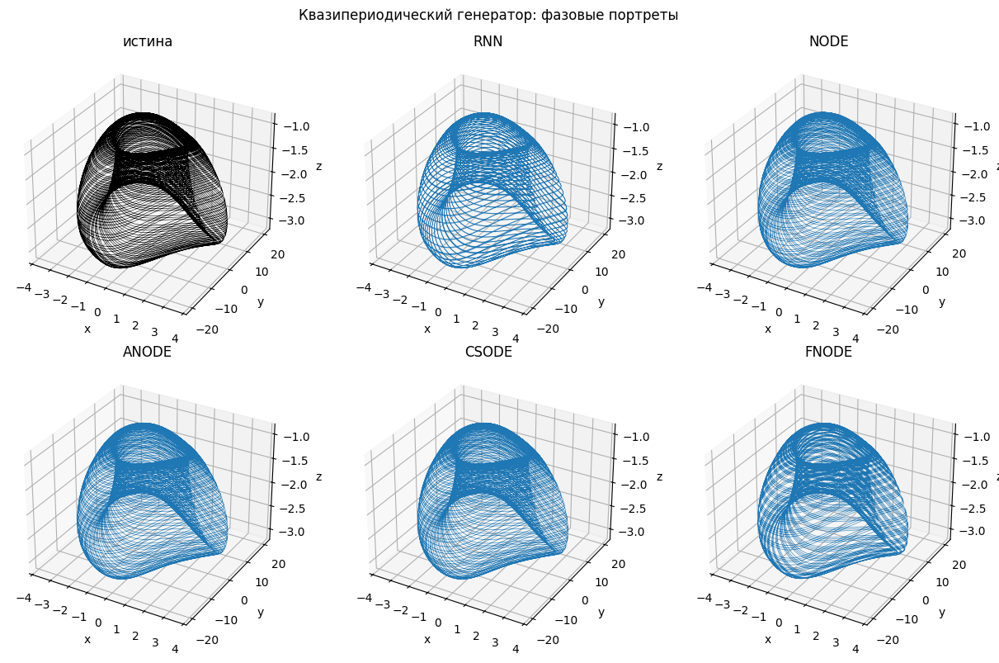

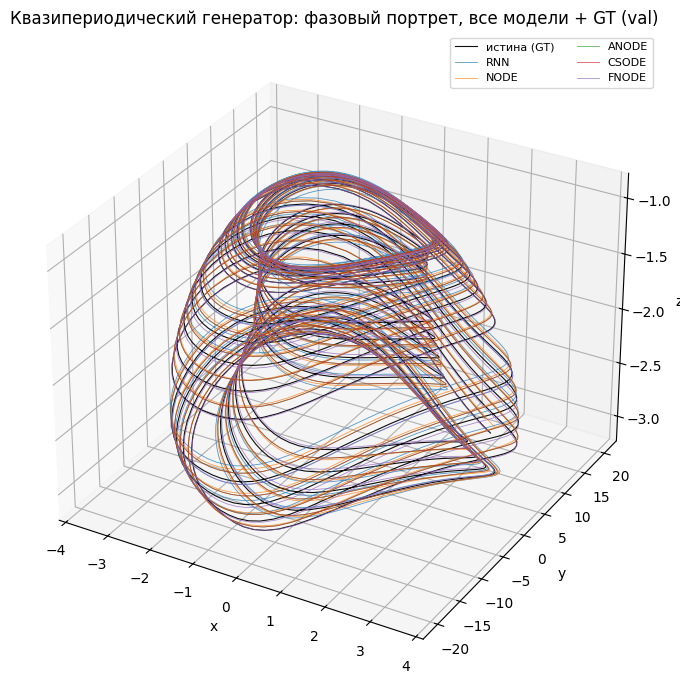

In [15]:
for sys_name in ["rossler", "hindmarsh_rose", "quasi_periodic"]:
    res = results.get(sys_name, [])
    if not res:
        continue
    sys_lbl = eu.SYSTEM_LABELS[sys_name]

    # 1) Временные ряды по всем компонентам
    fig = eu.plot_trajectories(res, figsize=(13, 8))
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_traj_full.png"), dpi=140)
    plt.show()

    # 2) Накопление ошибки
    fig = eu.plot_pointwise_error(res, figsize=(13, 4), log=True)
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_pointwise_err.png"), dpi=140)
    plt.show()

    # 3) Маргинальные распределения
    for c in range(res[0]["truth"].shape[1]):
        fig = eu.plot_marginal_hists(res, component=c, figsize=(8, 3.5),
                                       bw_scale=KDE_BW_SCALE)
        fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_hist_comp{c}.png"), dpi=140)
        plt.show()

    # 4) PSD
    for c in range(res[0]["truth"].shape[1]):
        fig = eu.plot_psd(res, component=c, figsize=(9, 4))
        fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_psd_comp{c}.png"), dpi=140)
        plt.show()

    # 5) Фазовые портреты
    fig = eu.plot_phase_portraits(res, val_only=True, figsize=(4.2, 4.0))
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_phase_val.png"), dpi=140)
    plt.show()
    fig = eu.plot_phase_portraits(res, val_only=False, figsize=(4.2, 4.0))
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_phase_full.png"), dpi=140)
    plt.show()

    # 5b) Совмещённый фазовый портрет (все модели + GT на одной оси, val)
    fig = eu.plot_phase_overlay(res, val_only=True, figsize=(8.0, 7.0))
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_phase_overlay_val.png"), dpi=140)
    plt.show()

## Доп. зум на начало val-области

Чтобы было видно момент расхождения с истиной, повторим временной ряд
только в окне `[t_split - 5, t_split + 25]`.

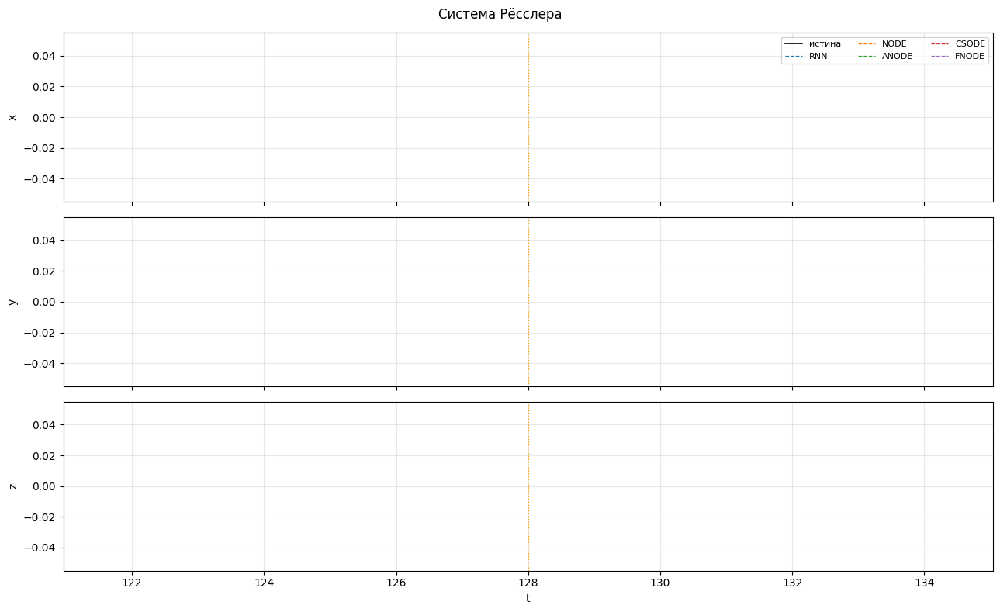

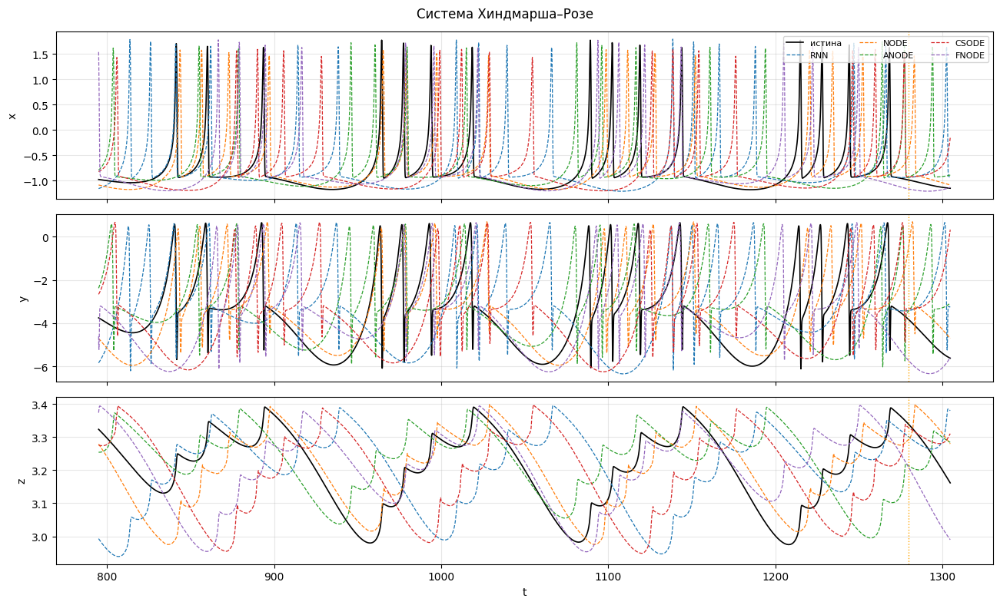

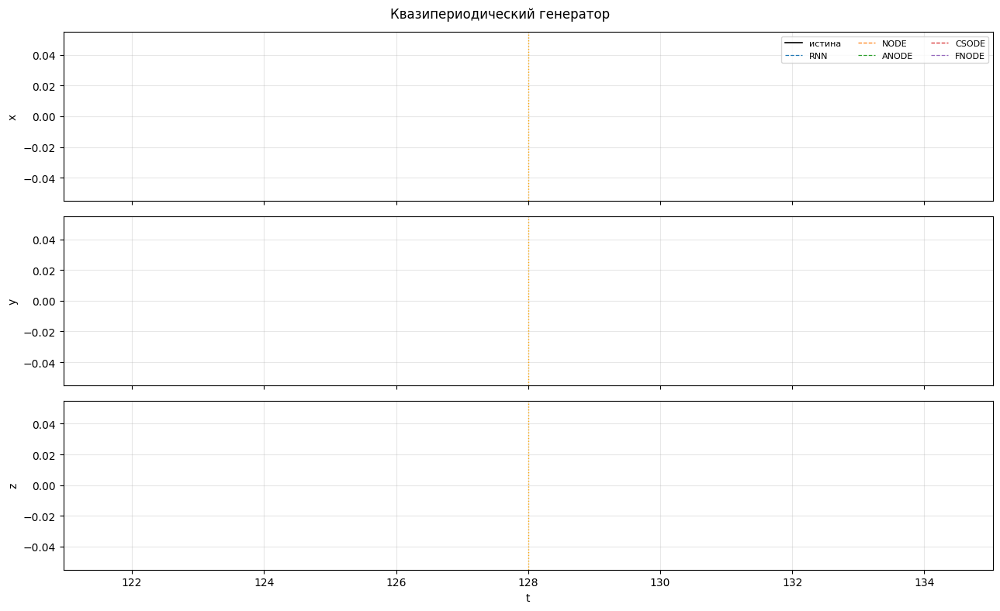

In [16]:
for sys_name in ["rossler", "hindmarsh_rose", "quasi_periodic"]:
    res = results.get(sys_name, [])
    if not res:
        continue
    dt = res[0]["dt"]
    t_split = res[0]["split_idx"] * dt
    t0 = max(0.0, 800 - 5.0)
    t1 = t_split + 25.0
    fig = eu.plot_trajectories(res, window=(t0, t1), figsize=(13, 8))
    fig.savefig(os.path.join(OUT_DIR, f"{sys_name}_traj_zoom.png"), dpi=140)
    plt.show()

## Диагностика burst-структуры (Хиндмарш–Розе)
Сравним истинную длительность burst-а и ISI с предсказанной.

In [17]:
hr_res = results.get("hindmarsh_rose", [])
if hr_res:
    rows = []
    bt_dur, bt_isi = hr_res[0]["burst_true"]
    rows.append(["истина", bt_dur, bt_isi])
    for r in hr_res:
        bp_dur, bp_isi = r["burst_pred"]
        rows.append([r["name"], bp_dur, bp_isi])
    burst_df = pd.DataFrame(rows, columns=["Модель",
                                            "T_burst (sec)",
                                            "ISI (sec)"])
    display(burst_df)
    burst_df.to_csv(os.path.join(OUT_DIR, "hr_burst_table.csv"), index=False)
else:
    print("Нет результатов для Хиндмарша-Розе")

,Модель,T_burst (sec),ISI (sec)
0,истина,2.040000,28.388889
1,RNN,2.100000,34.075000
2,NODE,2.111111,32.037500
3,ANODE,2.020000,32.022222
4,CSODE,2.144444,32.200000
5,FNODE,2.055556,30.562500


## Подробный per-component вывод KL/W1 и spectral_L1
Полезно, если в таблицу нужно вставить дополнительные метрики или
разбираться, какая компонента «ломается» сильнее.

In [18]:
rows = []
for sys_name, res in results.items():
    for r in res:
        d = {
            "system":    eu.SYSTEM_LABELS[sys_name],
            "model":     r["name"],
            "RMSE_val":  r["rmse_val"]["rmse"],
            "MAE_val":   r["rmse_val"]["mae"],
            "T_valid":   r["t_valid"],
            "spec_L1":   r["spectral_l1"],
            "W1_mean":   r["wasserstein_1"],
            "symKL":     r["sym_kl"],
        }
        for k, v in enumerate(r["sym_kl_per_component"]):
            d[f"symKL_c{k}"] = v
        for k, v in enumerate(r["wasserstein_1_per_component"]):
            d[f"W1_c{k}"] = v
        if sys_name == "hindmarsh_rose":
            d["T_burst_pred"]  = r["burst_pred"][0]
            d["T_burst_truth"] = r["burst_true"][0]
            d["ISI_pred"]      = r["burst_pred"][1]
            d["ISI_truth"]     = r["burst_true"][1]
        rows.append(d)
detail_df = pd.DataFrame(rows)
detail_df.to_csv(os.path.join(OUT_DIR, "long_details.csv"), index=False)
detail_df

,system,model,RMSE_val,MAE_val,T_valid,spec_L1,W1_mean,symKL,symKL_c0,symKL_c1,symKL_c2,W1_c0,W1_c1,W1_c2,T_burst_pred,T_burst_truth,ISI_pred,ISI_truth
0,Квазипериодический генератор,RNN,2.695393,1.739629,149.08,2.267976,0.042700,0.025393,0.011877,0.012047,0.052257,0.030346,0.029679,0.068077,NaN,NaN,NaN,NaN
1,Квазипериодический генератор,NODE,0.235365,0.151023,160.00,0.113972,0.009133,0.030307,0.009739,0.004722,0.076462,0.006173,0.006324,0.014902,NaN,NaN,NaN,NaN
2,Квазипериодический генератор,ANODE,0.502276,0.304232,160.00,0.188119,0.007996,0.022595,0.005093,0.003410,0.059282,0.005576,0.005147,0.013264,NaN,NaN,NaN,NaN
3,Квазипериодический генератор,CSODE,0.502276,0.304232,160.00,0.188119,0.007996,0.022595,0.005093,0.003410,0.059282,0.005576,0.005147,0.013264,NaN,NaN,NaN,NaN
4,Квазипериодический генератор,FNODE,0.147562,0.089828,160.00,0.043909,0.004899,0.008012,0.004855,0.007526,0.011655,0.004772,0.005045,0.004881,NaN,NaN,NaN,NaN
5,Система Рёсслера,RNN,6.606378,4.903791,100.10,2.436107,0.132720,0.780907,0.983235,0.946071,0.413414,0.124500,0.149609,0.124051,NaN,NaN,NaN,NaN
6,Система Рёсслера,NODE,3.232653,2.188346,153.60,0.687663,0.155894,0.591282,0.699316,0.665570,0.408959,0.160670,0.165394,0.141618,NaN,NaN,NaN,NaN
7,Система Рёсслера,ANODE,3.335486,2.128459,149.05,1.120841,0.119005,0.469645,0.458418,0.601908,0.348608,0.121738,0.126923,0.108353,NaN,NaN,NaN,NaN
8,Система Рёсслера,CSODE,3.335486,2.128459,149.05,1.120841,0.119005,0.469645,0.458418,0.601908,0.348608,0.121738,0.126923,0.108353,NaN,NaN,NaN,NaN
9,Система Рёсслера,FNODE,2.106712,1.245009,153.45,0.829787,0.023273,0.112768,0.053976,0.042194,0.242134,0.025111,0.017109,0.027598,NaN,NaN,NaN,NaN


Все артефакты — графики, CSV и `.tex` — сохранены в `notebooks/out_long/`.